# Multiple Linear Regression 

## Bike Sharing - Demand Prediction Case Study

### 1. Importing and Understanding the Data

In [1]:
# Import all required libraries (Numpy, Pandas, Seaborn Matplotlib) for performing multiple linear regression
import numpy as np
import pandas as pd
import seaborn as sns; sns.set_theme(color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline

# Import Statistical and Machine learning modules (Statsmodel, SKLearn) for Python
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import warnings # Suppress Warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# Set custom configurations For pandas. 
pd.set_option("display.max_rows", 900)
pd.set_option("display.max_columns", 900) 
pd.set_option('display.float_format', lambda x: '%.6f' % x)

##### Custom Functions

In [2]:
# To distinguish numerical columns either as categorical/discrete or non categorical and return as dict
def classify_feature_dtype(df,cols):
    d_categories = {'int_cat': [], "float_ts":[] }
    for col in cols:
        if (len(df[col].unique()) < 20):
            d_categories['int_cat'].append(col)
        else:
            d_categories['float_ts'].append(col)
    return d_categories

# Print all statistical information for a given set of columns
def show_stats(df, cols):
    for col in list(cols):
        print("Total Nulls: {0},\nMode: {1}".format(df[col].isna().sum(), df[col].mode()[0]))
        if len(df[col].unique()) < 50:
            print("\nUnique: {0}\n".format(df[col].unique()))
        if (df[col].dtype == int) or (df[col].dtype == float):
            print("Median   : {0}, \nVariance: {1}, \n\nDescribe: {2} \n".format(df[col].median(), df[col].var(), df[col].describe()))
        print("ValueCounts: {0} \n\n\n".format((df[col].value_counts(normalize=True) * 100).head(5)))
        print("------------------------------------------------------------------")

# Return the percentage of null values in each columns in a dataframe
def check_cols_null_pct(df):
    df_non_na = df.count() / len(df)  # Ratio of non null values
    df_na_pct = (1 - df_non_na) * 100 # Find the Percentage of null values
    return df_na_pct.sort_values(ascending=False) # Sort the resulting values in descending order

# Generates charts based on the data type of the cols, as part of the univariate analysis 
# it takes dataframe, columns, train data 0,1, and feature type as args.
def univariate_plots(df, cols, target=None, ftype=None, l_dict = None):
    for col in cols:
        #generate plots and graphs for category type. (generates piechart, countplot, boxplot / if training data is provided it generates bar chart instead)
        if ftype == "category":
            fig, axs = plt.subplots(1, 3, figsize=(20, 6))
                        
            col_idx = 0
            
            axs[col_idx].pie(x=df[col].value_counts().head(15), labels=df[col].value_counts().head(15).index, autopct="%1.1f%%", 
                    radius=1, textprops={"fontsize": 10, "color": "Black"}, startangle=90, rotatelabels=False)
            axs[col_idx].set_title("PieChart of {0}".format(col), y=1); plt.xticks(rotation=45); plt.ylabel("Percentage")
            fig.subplots_adjust(wspace=0.5, hspace=0.3)
            
            col_idx += 1

            sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette="viridis",  ax=axs[col_idx])
            if (l_dict is not None) and (l_dict.get(col) is not None):
                axs[col_idx].legend([ f'{k} - {v}' for k,v in l_dict[col].items()])
            axs[col_idx].set_title("Countplot of {0}".format(col)); plt.xticks(rotation=45); plt.xlabel(col); plt.ylabel("Count")
            fig.subplots_adjust(wspace=0.5, hspace=0.3)

            col_idx += 1
            
            ax = sns.barplot(data=df, x=col, y=target, palette="viridis",  ax=axs[col_idx], errwidth=0)
            for i in ax.containers:
                ax.bar_label(i,)
            axs[col_idx].set_title('Barplot against target'); plt.xticks(rotation=45); plt.xlabel(col)
            fig.subplots_adjust(wspace=0.5, hspace=0.3)

            plt.suptitle("Univariate analysis of {0}".format(col), fontsize=12, y=0.95)
            plt.tight_layout()
            plt.subplots_adjust(top=0.85)
            plt.show()
            plt.clf()

        #generate plots and graphs for numerical types. (generates boxplot, histplot, kdeplot, scatterplot)
        elif ftype == "non_categorical":        
            fig, axs = plt.subplots(1, 4, figsize=(20, 6))
            
            col_idx = 0
            
            sns.boxplot(data=df, y=col, palette="viridis", flierprops=dict( marker="o", markersize=6, markerfacecolor="red", markeredgecolor="black"),
                        medianprops=dict(linestyle="-", linewidth=3, color="#FF9900"), whiskerprops=dict(linestyle="-", linewidth=2, color="black"),
                        capprops=dict(linestyle="-", linewidth=2, color="black"), ax=axs[col_idx])
            axs[col_idx].set_title("Boxplot of {0}".format(col)); plt.xticks(rotation=45); plt.xlabel(col)
            fig.subplots_adjust(wspace=0.5, hspace=0.3)
            
            col_idx += 1

            axs[col_idx].hist(data=df, x=col, label=col)
            axs[col_idx].set_title("Histogram of {0}".format(col)); plt.xticks(rotation=45); plt.xlabel(col)
            fig.subplots_adjust(wspace=0.5, hspace=0.3)
            
            col_idx += 1

            sns.kdeplot(df[col], shade=True, ax=axs[col_idx])
            axs[col_idx].set_title("KDE plot of {0}".format(col)); plt.xticks(rotation=45); plt.xlabel(col)
            fig.subplots_adjust(wspace=0.5, hspace=0.3)
            
            col_idx += 1

            sns.scatterplot(df[col], ax=axs[col_idx])
            axs[col_idx].set_title("Scatterplot of {0}".format(col)); plt.xticks(rotation=45); plt.xlabel(col)
            fig.subplots_adjust(wspace=0.5, hspace=0.3)

            plt.suptitle("Univariate analysis of {0}".format(col), fontsize=12, y=0.95)
            plt.tight_layout()
            plt.subplots_adjust(top=0.85)
            plt.show()
            plt.clf()
    
# Perform Outlier analysis on the given dataframe.
# Find Lower threshold, Upper threshold and IQR values. 
# Return the Result as a dataframe. 
# find_outlier = True argument: restricts the output df to outlier columns. whereas find_outlier = False: returns results for all columns
def get_extremeval_threshld(df, find_outlier=False):
    outlier_df = pd.DataFrame(columns=[i for i in df.columns if find_outlier == True], data=None)
    
    for col in df.columns:
        thirdq, firstq = df[col].quantile(0.75), df[col].quantile(0.25)
        iqr = 1.5 * (thirdq - firstq)
        extvalhigh, extvallow = iqr + thirdq, firstq - iqr
        
        if find_outlier == True:
            dfout = df.loc[(df[col] > extvalhigh) | (df[col] < extvallow)]
            dfout = dfout.assign(name=col, thresh_low=extvallow, thresh_high=extvalhigh)
        else:
            dfout = pd.DataFrame([[col, extvallow, extvalhigh]], columns=['name', 'thresh_low', 'thresh_high'])
            
        outlier_df = pd.concat([outlier_df, dfout])
    # outlier_df = outlier_df.reset_index(drop=True)
    outlier_df = outlier_df.set_index('name',drop=True)
    return outlier_df

In [3]:
# import and read the dataset
bike_share_df = pd.read_csv('day.csv', sep=",", header=0)
bike_share_df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.181250,80.583300,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.686950,69.608700,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.470250,43.727300,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.606100,59.043500,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.463500,43.695700,12.522300,82,1518,1600


### 2. EDA - Data Cleaning and Data Visualization

In [4]:
# Perform renaming of inconsistent columns and drop the unnecessary
bike_share_df = bike_share_df.drop(columns=['instant '], errors='ignore')
bike_share_df = bike_share_df.rename(str.strip, axis='columns')
bike_share_df = bike_share_df.rename({'dteday':'date', 'yr':'year', 'mnth':'month', 'atemp':'actual_temp', 'hum':'humidity', 'casual':'casual_users', 'registered':'registered_users', 'cnt':'total_cnt'}, axis='columns')

bike_share_df.columns # get the list of columns
bike_share_df.info() # shows column information

Index(['date', 'season', 'year', 'month', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temp', 'actual_temp', 'humidity', 'windspeed',
       'casual_users', 'registered_users', 'total_cnt'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              730 non-null    object 
 1   season            730 non-null    int64  
 2   year              730 non-null    int64  
 3   month             730 non-null    int64  
 4   holiday           730 non-null    int64  
 5   weekday           730 non-null    int64  
 6   workingday        730 non-null    int64  
 7   weathersit        730 non-null    int64  
 8   temp              730 non-null    float64
 9   actual_temp       730 non-null    float64
 10  humidity          730 non-null    float64
 11  windspeed         730 non-null    float64
 12  casual_users      730 non-null    int64  
 13  registered_users  730 non-null    int64  
 14  total_cnt         730 non-null    int64  
dtypes: float64(4), int64(10), object(1)
memory usage: 85.7+ KB


In [5]:
# Return the percentage of null values in each columns in a dataframe
check_cols_null_pct(bike_share_df) 

# Print all statistical information for a given set of columns
show_stats(bike_share_df, bike_share_df.columns) 

date               0.000000
season             0.000000
year               0.000000
month              0.000000
holiday            0.000000
weekday            0.000000
workingday         0.000000
weathersit         0.000000
temp               0.000000
actual_temp        0.000000
humidity           0.000000
windspeed          0.000000
casual_users       0.000000
registered_users   0.000000
total_cnt          0.000000
dtype: float64

Total Nulls: 0,
Mode: 01-01-2018 
ValueCounts: date
01-01-2018    0.136986
25-04-2019    0.136986
27-04-2019    0.136986
28-04-2019    0.136986
29-04-2019    0.136986
Name: proportion, dtype: float64 



------------------------------------------------------------------
Total Nulls: 0,
Mode: 3

Unique: [1 2 3 4]

Median   : 3.0, 
Variance: 1.232508408967052, 

Describe: count   730.000000
mean      2.498630
std       1.110184
min       1.000000
25%       2.000000
50%       3.000000
75%       3.000000
max       4.000000
Name: season, dtype: float64 

ValueCounts: season
3   25.753425
2   25.205479
1   24.657534
4   24.383562
Name: proportion, dtype: float64 



------------------------------------------------------------------
Total Nulls: 0,
Mode: 0

Unique: [0 1]

Median   : 0.5, 
Variance: 0.2503429355281207, 

Describe: count   730.000000
mean      0.500000
std       0.500343
min       0.000000
25%       0.000000
50%       0.500000
75%       1.000000
max       1.000000
Name: year, d

##### Replace column values

In [6]:
# Replace columns with nominal values into strings
bike_share_df['season']     = bike_share_df['season'].replace(to_replace = [1, 2, 3, 4], value = ['Spring', 'Summer', 'Fall', 'Winter'])
bike_share_df['year']       = bike_share_df['year'].replace(to_replace = [0, 1], value = [2018, 2019])
bike_share_df['month']      = bike_share_df['month'].replace(to_replace = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], value = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
bike_share_df['holiday']    = bike_share_df['holiday'].replace(to_replace = [0, 1], value = ['NotHoliday', 'Holiday'])
bike_share_df['weekday']    = bike_share_df['weekday'].replace(to_replace = [0, 1, 2, 3, 4, 5, 6], value = ['Sun', 'Mon', 'Tue', 'Wed', 'Thur', 'Fri', 'Sat'])
bike_share_df['workingday'] = bike_share_df['workingday'].replace(to_replace = [0, 1], value = ['NotWorkingday', 'Workingday'])
bike_share_df['weathersit'] = bike_share_df['weathersit'].replace(to_replace = [1, 2, 3, 4], value = ['Cloud', 'Mist', 'LightRain', 'HeavyRain'])

# Convert dtype of columns to category for categorical columns
bike_share_df[['season', 'year', 'month', 'holiday', 'weekday', 'workingday', 'weathersit']] = bike_share_df[['season', 'year', 'month', 'holiday', 'weekday', 'workingday', 'weathersit']].astype('category')
# Convert date to datetime format
bike_share_df['date'] = pd.to_datetime(bike_share_df['date'], dayfirst=True, format='mixed')

# Distinguish numerical columns either as categorical/discrete or non-categorical/ continuous and return as dict
dtype_dict = classify_feature_dtype(bike_share_df, bike_share_df.columns)

##### Outlier Analysis

In [7]:
mask = bike_share_df.columns.isin(dtype_dict['int_cat']) # retrieve columns of categorical type for masking

# function to retrieve lower threshold and higher threshold for all continuous type columns 
col_threshld = get_extremeval_threshld(bike_share_df.loc[:,~mask], find_outlier = False)
col_threshld

# function to retrieve lower threshold and higher threshold for Outlier columns and find the count
extreme_val_df = get_extremeval_threshld(bike_share_df.loc[:,~mask], find_outlier = True)
outlier_cols = extreme_val_df.groupby(by='name')[['thresh_low','thresh_high']].value_counts()
outlier_cols

bike_share_df[['humidity', 'windspeed', 'casual_users']].describe([.05,.10,.75,.95,.99])

,thresh_low,thresh_high
name,,
date,2017-01-01 12:00:00,2020-12-29 12:00:00
temp,-5.791209,46.483709
actual_temp,-3.444381,50.779869
humidity,20.515637,104.473938
windspeed,-0.834259,25.501498
casual_users,-854.125000,2266.875000
registered_users,-919.250000,8204.750000
total_cnt,-1024.625000,10160.375000


name          thresh_low   thresh_high
casual_users  -854.125000  2266.875000    44
humidity      20.515637    104.473938      2
windspeed     -0.834259    25.501498      13
Name: count, dtype: int64

,humidity,windspeed,casual_users
count,730.000000,730.000000,730.000000
mean,62.765175,12.763620,849.249315
std,14.237589,5.195841,686.479875
min,0.000000,1.500244,2.000000
5%,40.741735,5.326052,88.450000
10%,45.000000,6.704754,139.900000
50%,62.625000,12.125325,717.000000
75%,72.989575,15.625589,1096.500000
95%,86.868735,22.999988,2355.000000
99%,92.795857,27.380948,2931.680000


#### Univariate and Bivariate Analysis

Univariate Analysis of categorical Variables


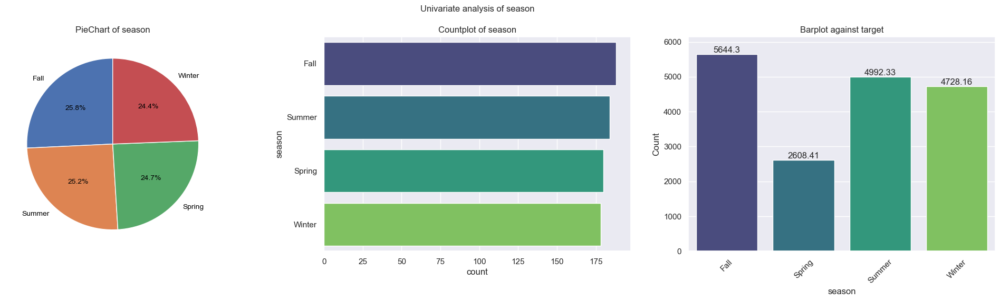

<Figure size 640x480 with 0 Axes>

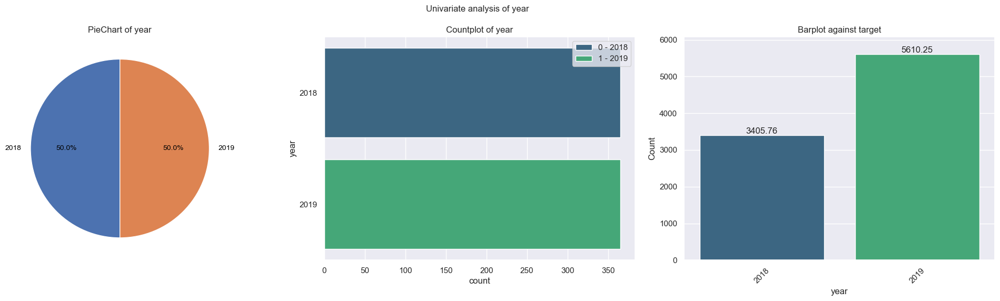

<Figure size 640x480 with 0 Axes>

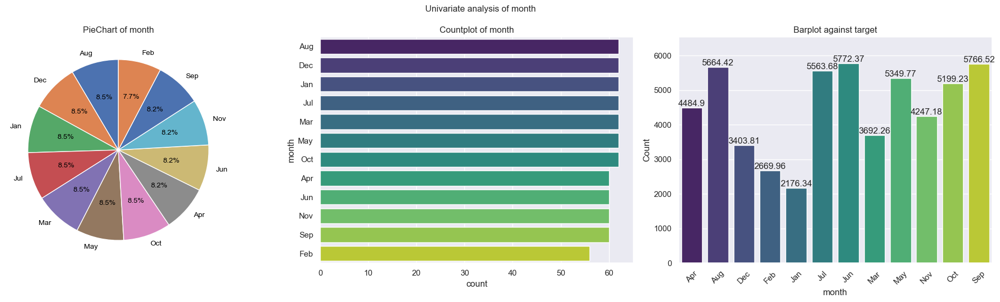

<Figure size 640x480 with 0 Axes>

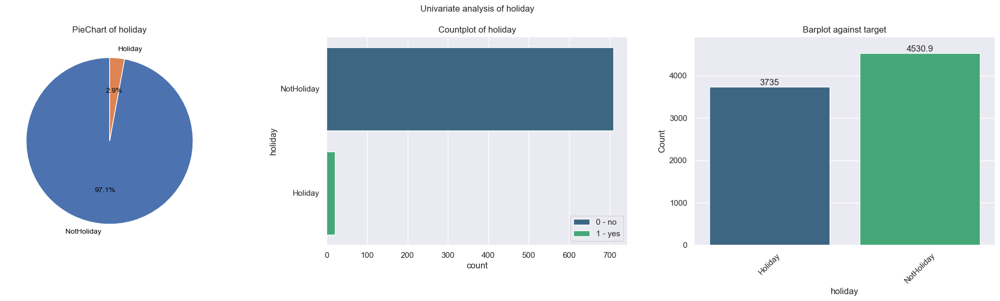

<Figure size 640x480 with 0 Axes>

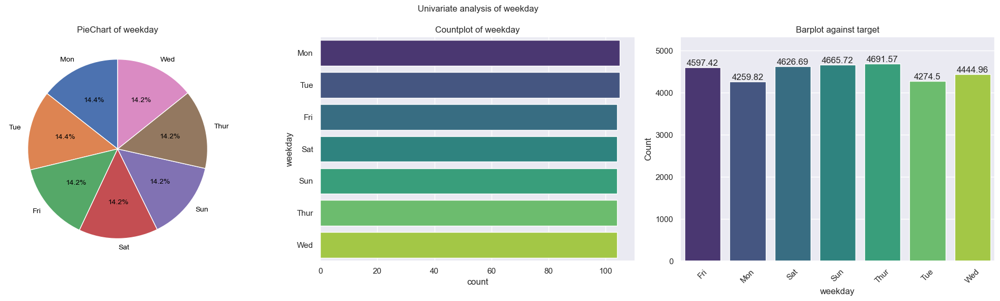

<Figure size 640x480 with 0 Axes>

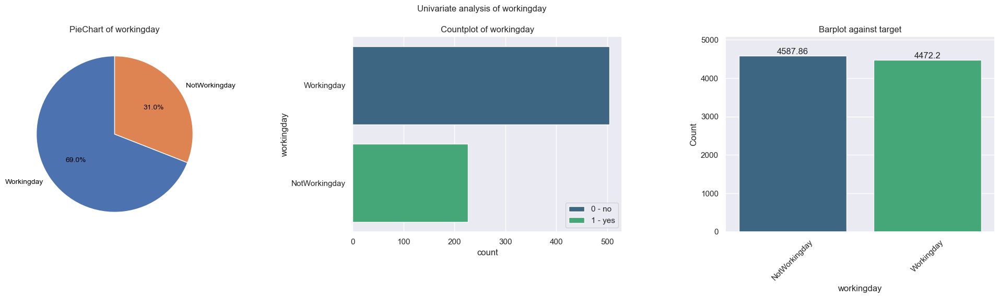

<Figure size 640x480 with 0 Axes>

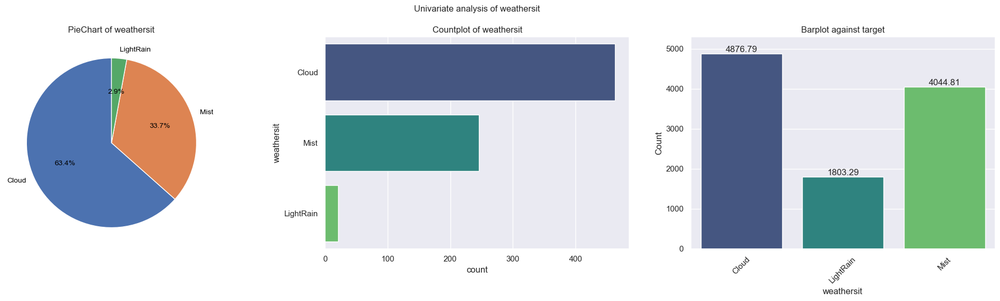

--------------------------------------------------------------------------
Univariate Analysis of Continuous Variables


<Figure size 640x480 with 0 Axes>

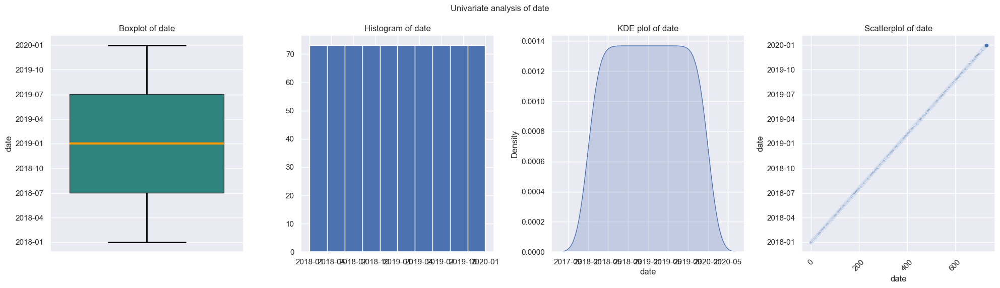

<Figure size 640x480 with 0 Axes>

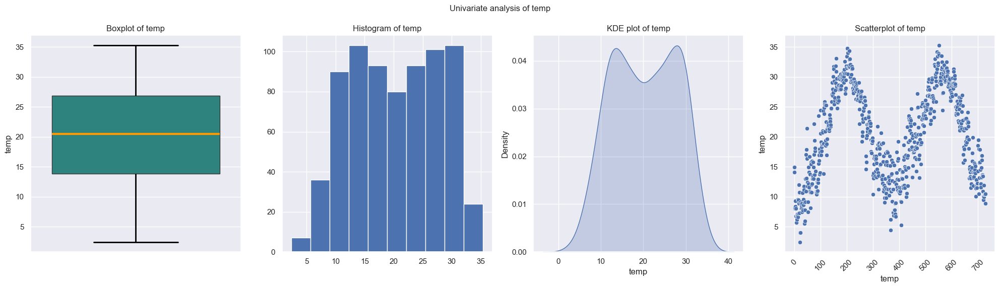

<Figure size 640x480 with 0 Axes>

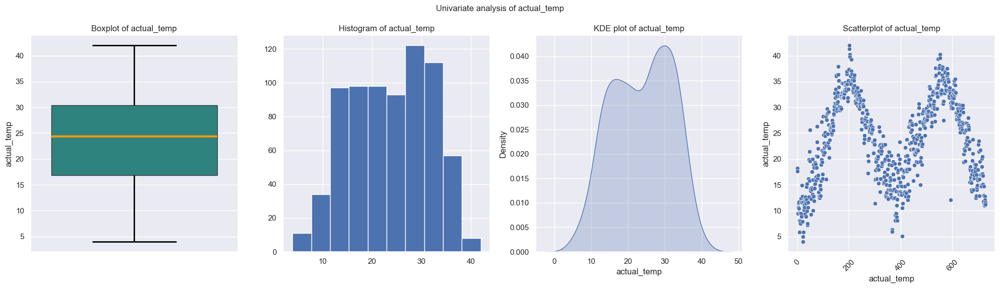

<Figure size 640x480 with 0 Axes>

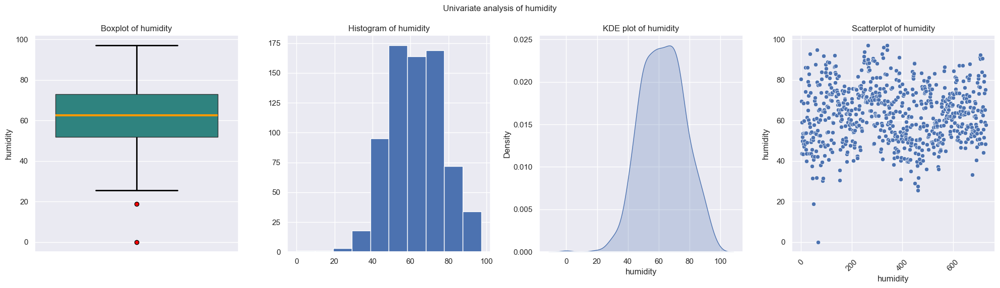

<Figure size 640x480 with 0 Axes>

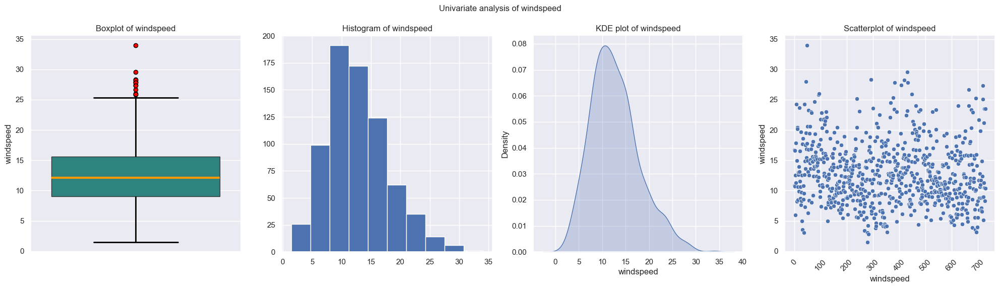

<Figure size 640x480 with 0 Axes>

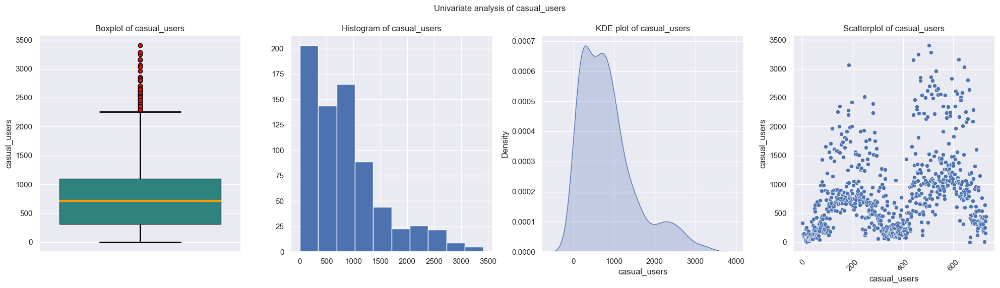

<Figure size 640x480 with 0 Axes>

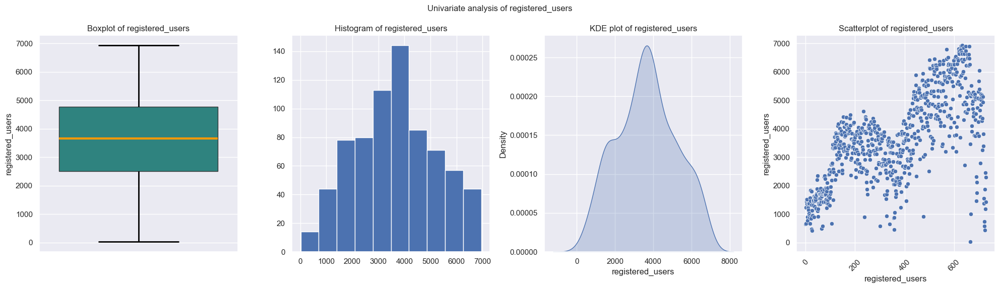

<Figure size 640x480 with 0 Axes>

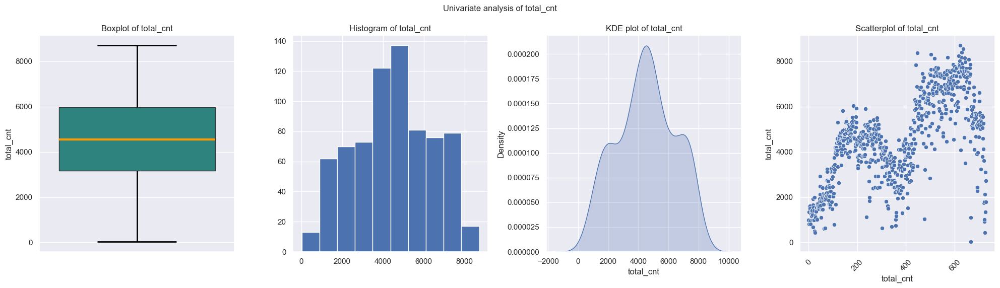

--------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

In [8]:
label_dict = {'year':{0: 2018, 1:2019},'holiday':{0:'no',1:'yes'},'workingday':{0:'no',1:'yes'}}

# Plot Univariate graphs for both categorical and continuous variables. as well as perform bivariate analysis against total_cnt column
print("Univariate Analysis of categorical Variables")
univariate_plots(bike_share_df, dtype_dict['int_cat'], target='total_cnt', ftype = "category", l_dict=label_dict) 
print("--------------------------------------------------------------------------")
print("Univariate Analysis of Continuous Variables")
univariate_plots(bike_share_df, dtype_dict['float_ts'], target='total_cnt', ftype = "non_categorical")
print("--------------------------------------------------------------------------")

#### Observations:

#### Categorical Features

	#### Season
	
		• Total_cnt of users is very low for the Spring Season
		
		• Total_cnt of users is in the fall is very high
		
		• Seasonal changes have an impact on the user decision

	#### Year
	
		• there is a significant growth in total_cnt in 2019 compared to 2018.
		
		• This can be a positive sign that there is a positive growth projection

	#### Weekday

		• The total_cnt of users remains in a similar range for all the days of the week
		
		• Highest on Thursday
		
		• Lowest on Monday
		
		• End of the week sees a slight surge in demand

	#### month

		• Jun saw the most user count
		
		• whereas the Jan month saw least users count
		
		• overall, there is a trend that the usage drops at the start and end of the year months

	#### Holiday

		- Total non holiday days are higher compared to holidays

	#### Weathersit

		- Most days in the year are cloudy
		
		• There is a significant increase in total_cnt on Cloudy days
		
		• Whereas there is significant decrease in LightRain days
		
		• Users prefer to use bike platforms on a cloudy day

	### Numerical Features

		- There are Outliers in Windspeed, Humidty, Casual_Users features
		
		- Windspeed, casual users are positively skewed , while humidity is negatively skewed
		
		- registerd users, total_cnt are normally distributed

#### Fix Outliers

In [9]:
# Fix Outliers by setting either thresh low or thresh low for both extremes 
lower_cutoff = col_threshld.loc['humidity','thresh_low']
bike_share_df['humidity'] = np.where((bike_share_df['humidity'] < lower_cutoff), lower_cutoff, bike_share_df['humidity'])
	
upper_cutoff = col_threshld.loc['windspeed','thresh_high']
bike_share_df['windspeed'] = np.where((bike_share_df['windspeed'] > upper_cutoff), upper_cutoff, bike_share_df['windspeed'])

#### Bivariate Analysis

There is a significant growth in User count for 2019, comparison to the first year 2018, also it had a downward trend at the of 2019

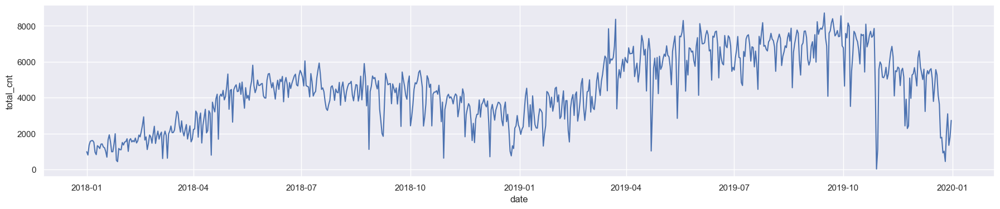

In [10]:
# line graph of date vs total_cnt
plt.figure(figsize=(22,4));
sns.lineplot(x='date',y='total_cnt', data=bike_share_df, palette="flare");
plt.show();

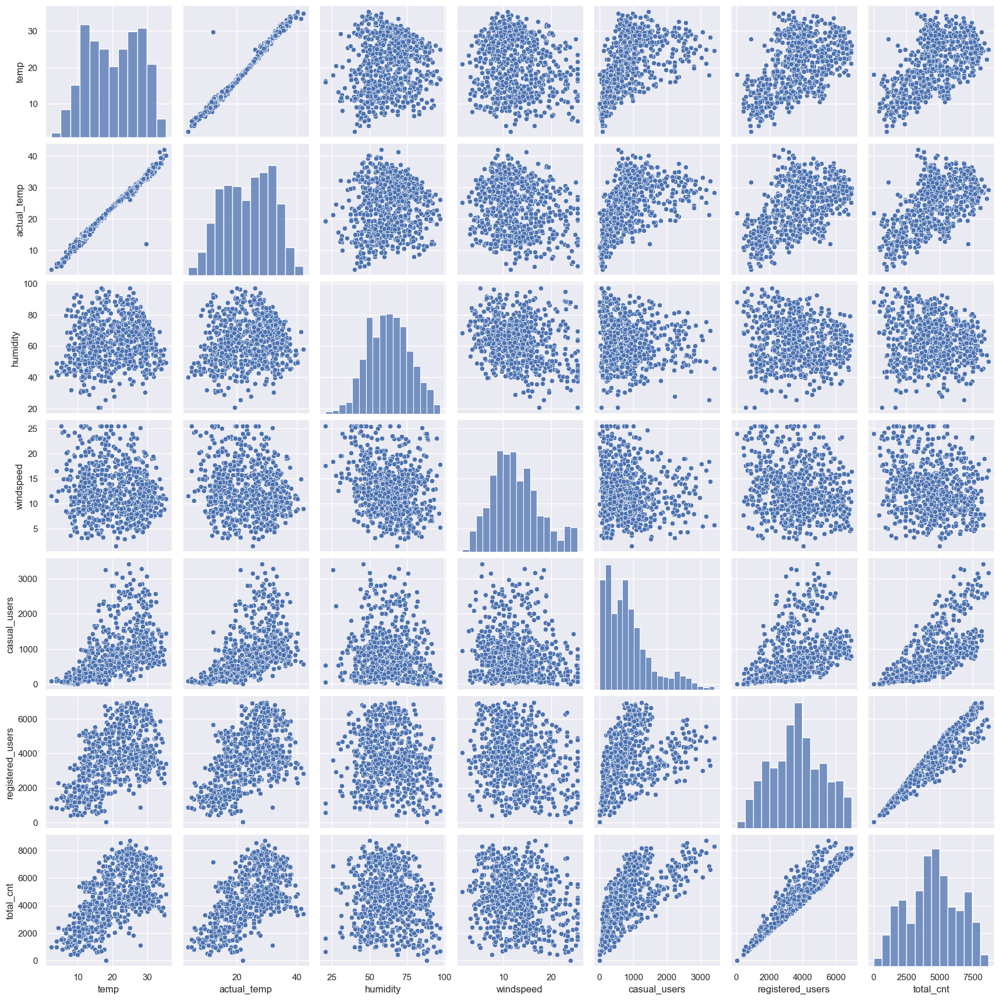

In [11]:
# Pairplot analysis of all the continuous feature columns in the dataframe.  
sns.pairplot(bike_share_df[['temp','actual_temp','humidity','windspeed','casual_users','registered_users', 'total_cnt']])
plt.show();

There are high correlation between :

registered users vs total_cnt , 
casual_users vs total _cnt, 
temp vs total_cnt, 
actual_temp vs total_cnt

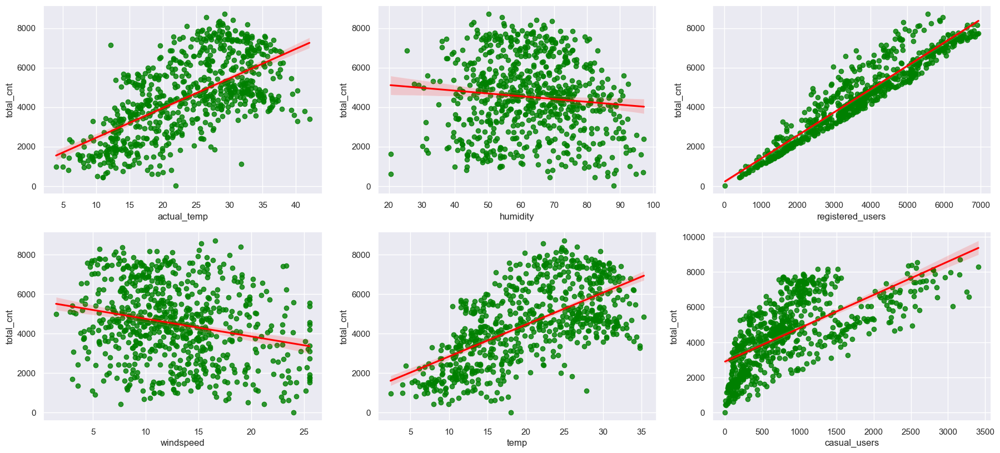

In [12]:
# Regression line analysis of all the continuous feature type columns. 
axs = 331
plt.figure(figsize=(22,15))
for i in list(set(dtype_dict['float_ts']) - set(['date','total_cnt'])):
    plt.subplot(axs)
    sns.regplot(x=i, y='total_cnt' ,data=bike_share_df,color= 'green', line_kws={"color": "red"})
    axs += 1
plt.show();

(temp, actual_temp, resitered_users, casual_users) vs total_cnt are positively correlated
whereas the windspeed, humidity does not show high correlation but the regression lines show a negative trend

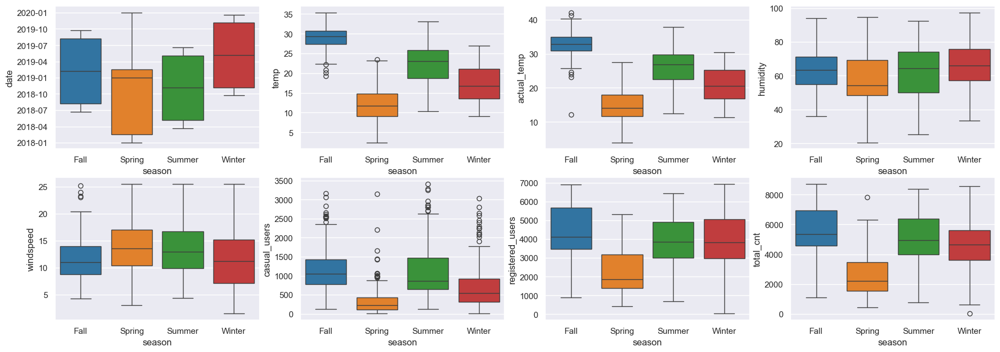

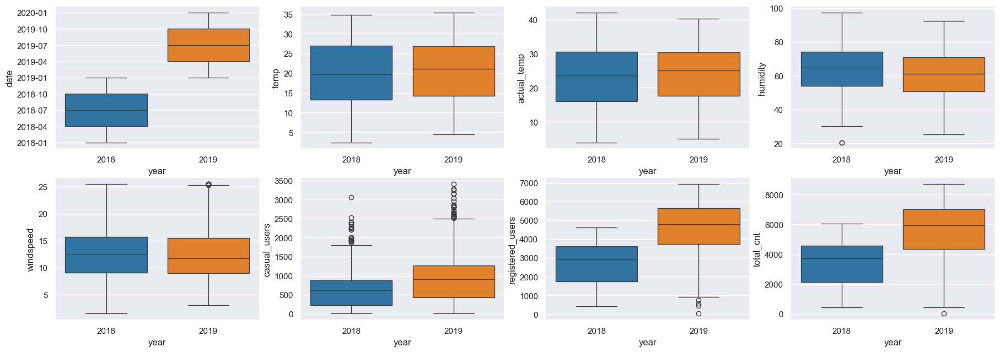

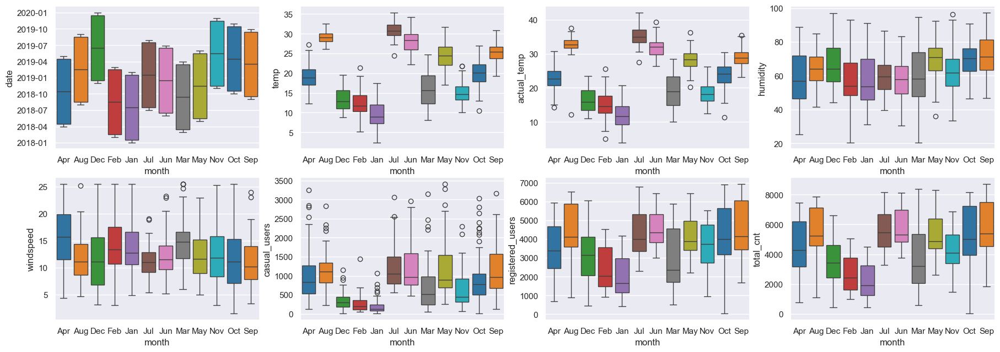

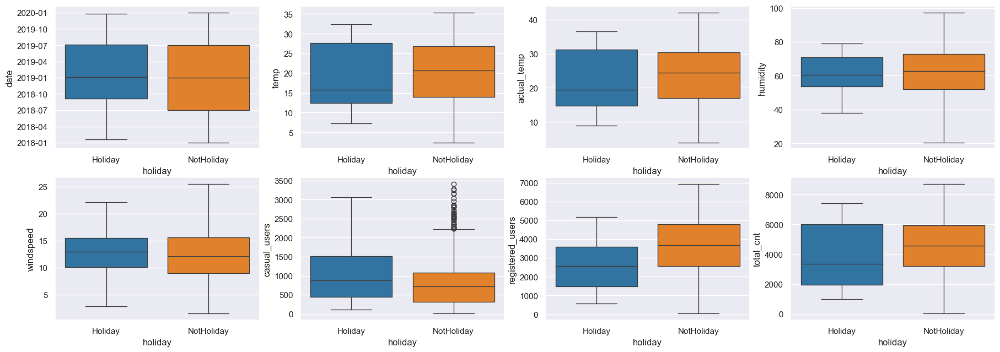

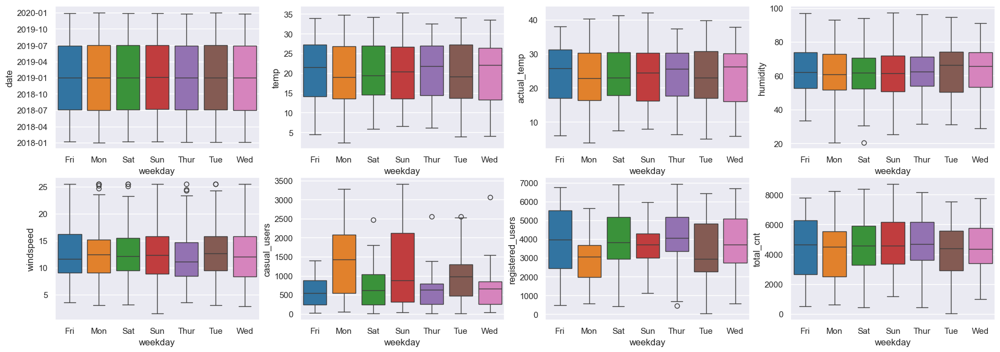

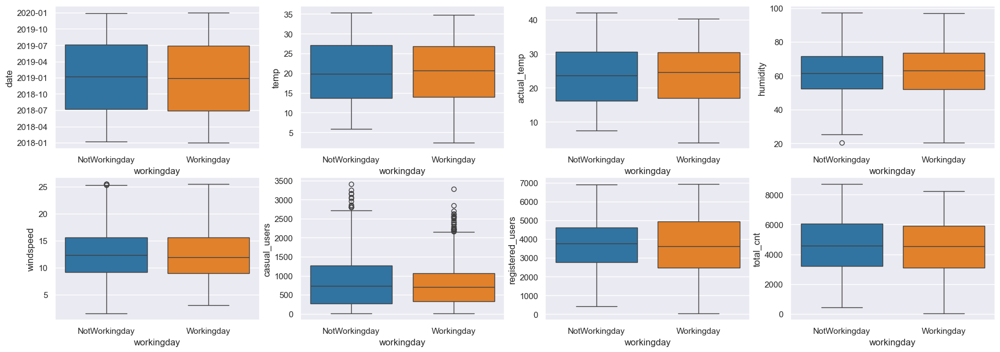

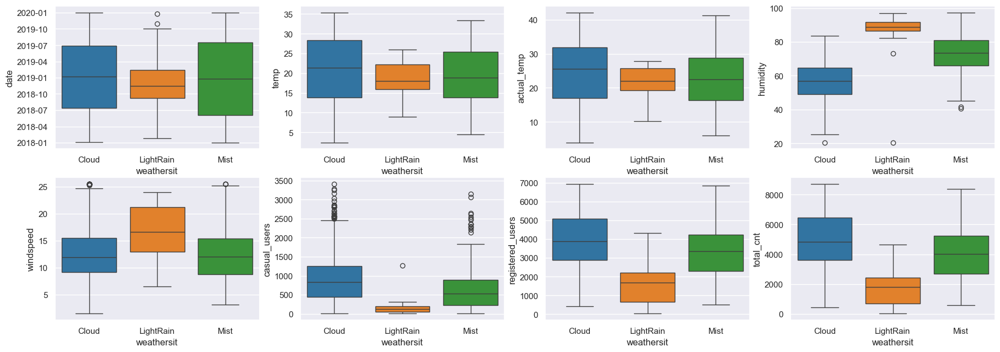

In [13]:
# Generate Bivariate Boxplots combinations for all the categorical and continuous columns
x_lst = list(dtype_dict['int_cat']) # x_list variable contains all the categorical Columns 
y_lst = list(dtype_dict['float_ts'])# y_list contains all Continuous feature type columns 

axs = 1
for x_col in x_lst:
    plt.figure(figsize=(22,72))
    for y_col in y_lst:
        plt.subplot(18,4,axs)
        sns.boxplot(x=x_col, y=y_col, data=bike_share_df, palette='tab10')
        axs += 1
    plt.show();
plt.show();

#### Multivariate Analysis

!!!!! Deliberately commented to avoid consuming CPU resources. and it may run for a long time. (output is already generated)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

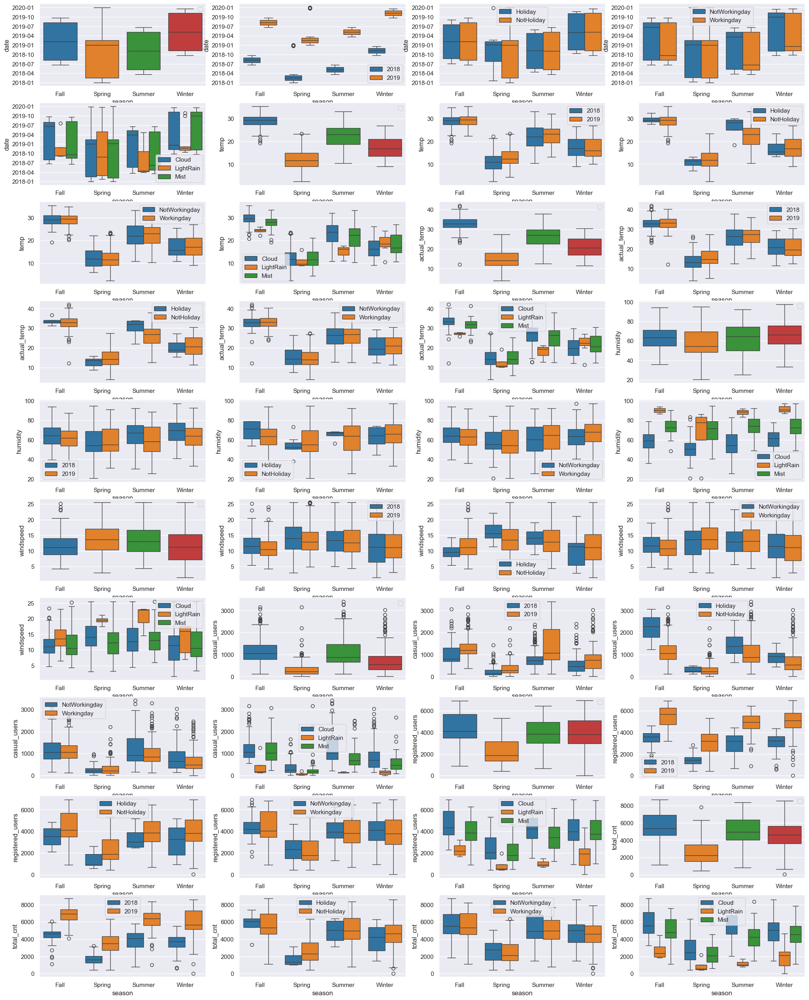

--------------------------------------------------------------------------


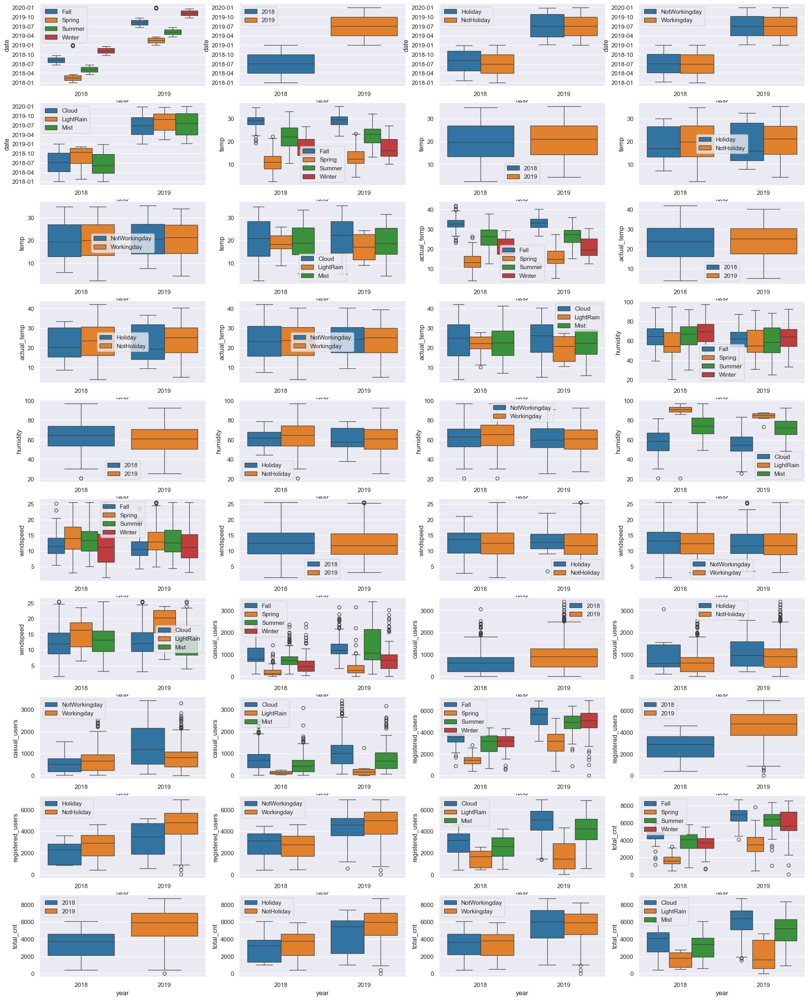

--------------------------------------------------------------------------


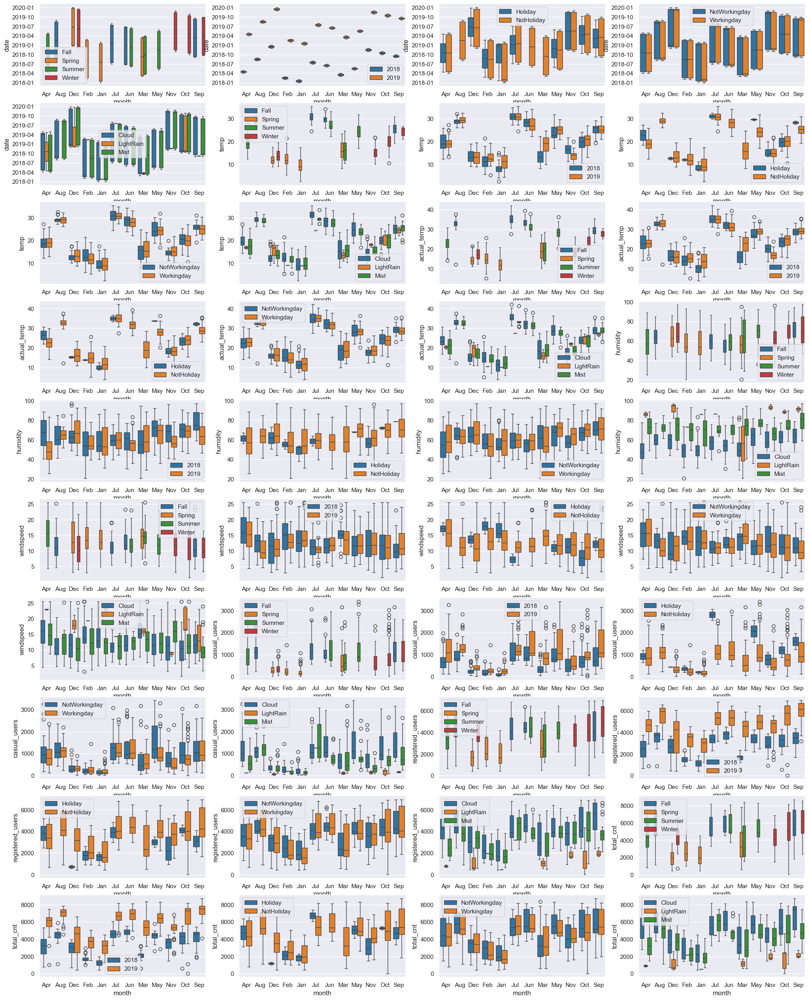

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


--------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

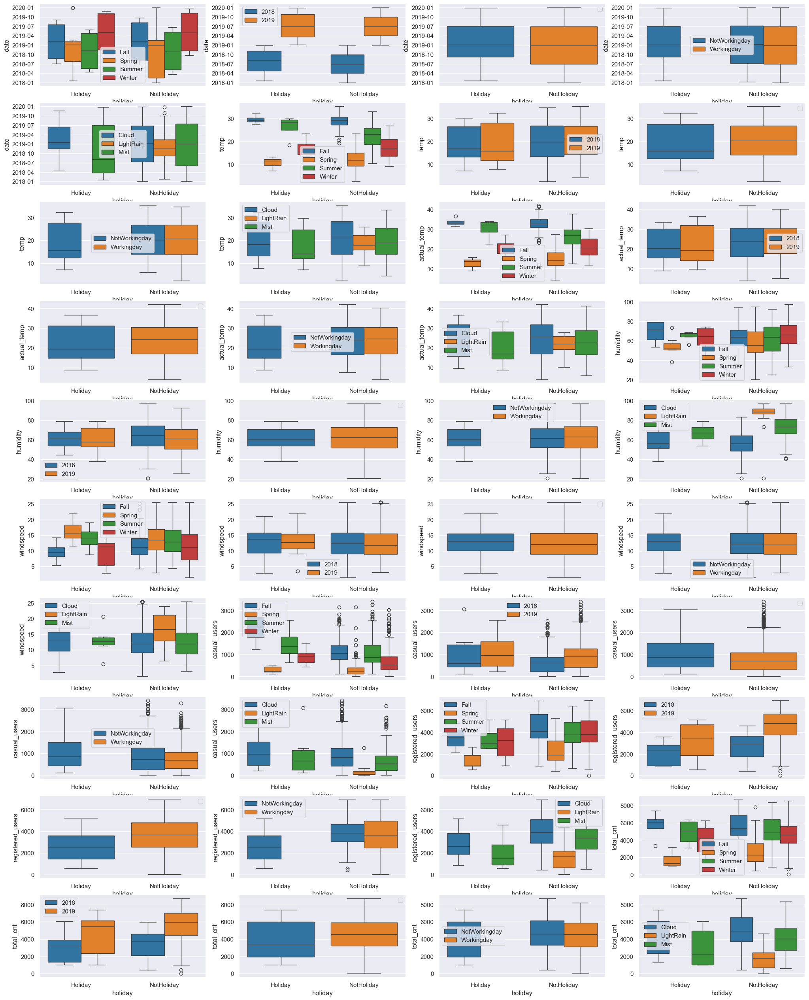

--------------------------------------------------------------------------


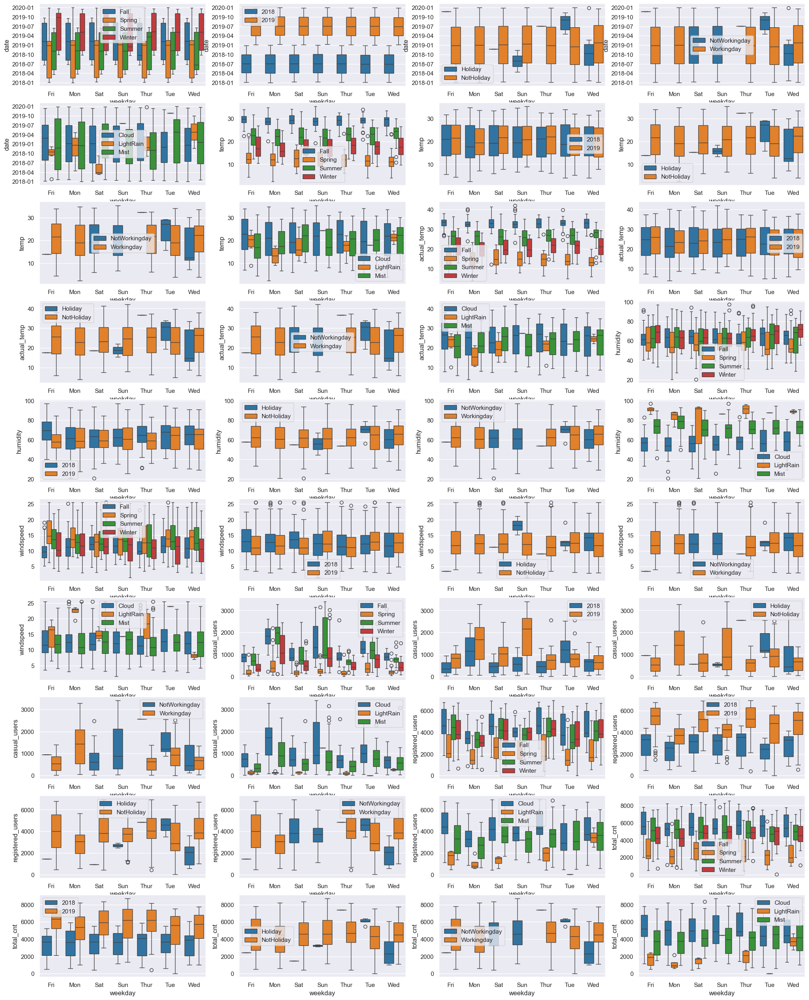

--------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

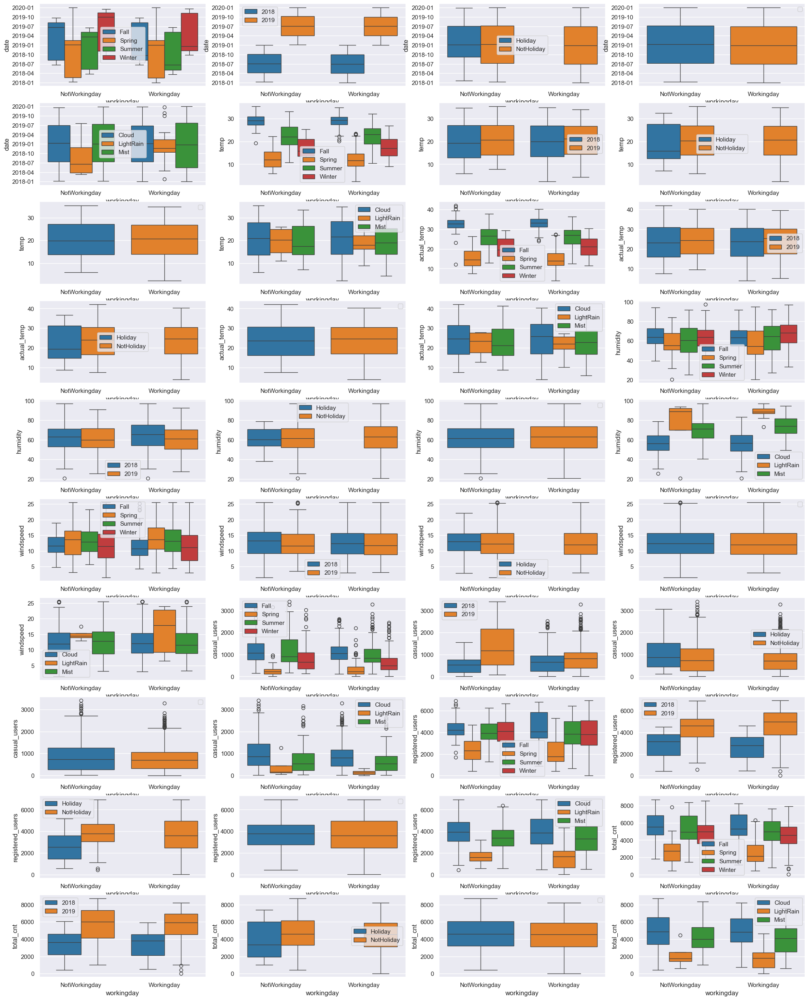

--------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

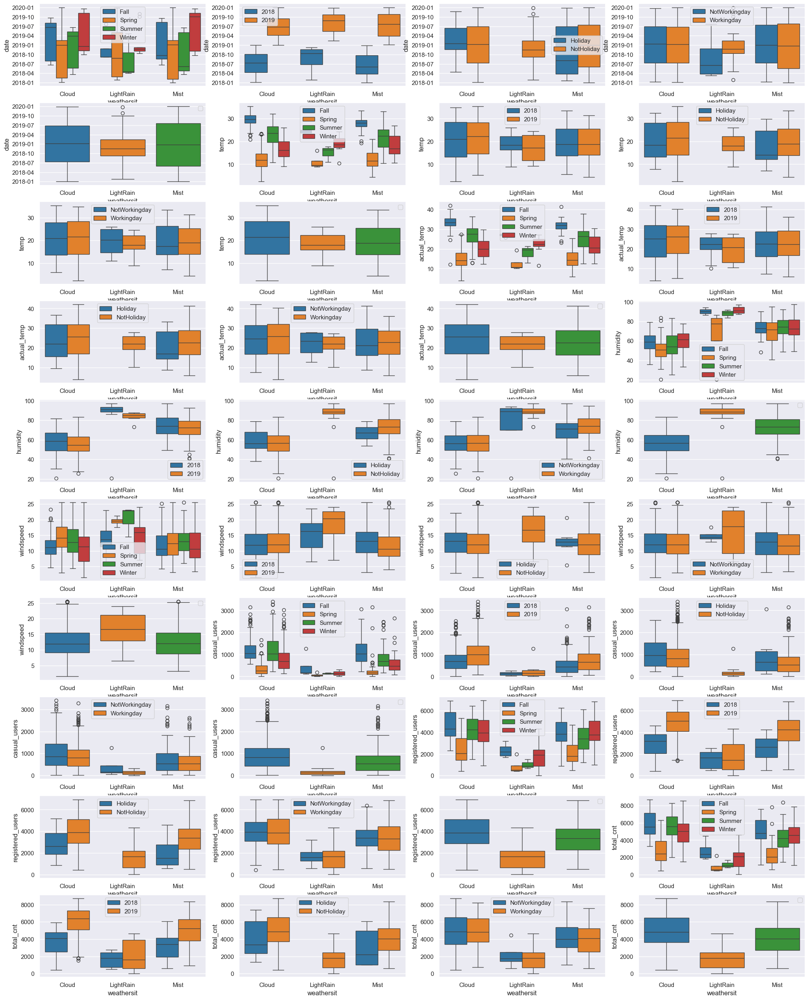

--------------------------------------------------------------------------


In [14]:
# # Multivariate Boxplots  - 
# z_lst = x_lst = list(dtype_dict['int_cat'])
# y_lst = list(dtype_dict['float_ts'])

# z_lst = x_lst.copy()
# z_lst.remove('month')
# z_lst.remove('weekday')

# axs = 1
# for x_col in x_lst:
#     plt.figure(figsize=(25,650))
#     for y_col in y_lst:
#         for z_col in z_lst:
#             plt.subplot(200,4,axs)
#             sns.boxplot(x=x_col, y=y_col, hue=z_col, data=bike_share_df, palette='tab10')
#             plt.legend()
#             axs += 1
#     plt.show();
#     # axs = 1
#     print("--------------------------------------------------------------------------")
# plt.show();

In [15]:
# Find the Top 10 Correlations amongst the columns using df.corr()

corr_0 = bike_share_df.corr(numeric_only=True).abs()
corr_0 = corr_0.unstack()
correlation_0 = corr_0.sort_values()
correlation_0 = corr_0.dropna()

correlation_0 = correlation_0[correlation_0 != 1.0]
correlation_target_zero = correlation_0.reset_index()
correlation_target_zero.sort_values(by=0, ascending=False).head(10)

,level_0,level_1,0
0,temp,actual_temp,0.991696
6,actual_temp,temp,0.991696
35,registered_users,total_cnt,0.945411
41,total_cnt,registered_users,0.945411
40,total_cnt,casual_users,0.672123
29,casual_users,total_cnt,0.672123
11,actual_temp,total_cnt,0.630685
37,total_cnt,actual_temp,0.630685
36,total_cnt,temp,0.627044
5,temp,total_cnt,0.627044


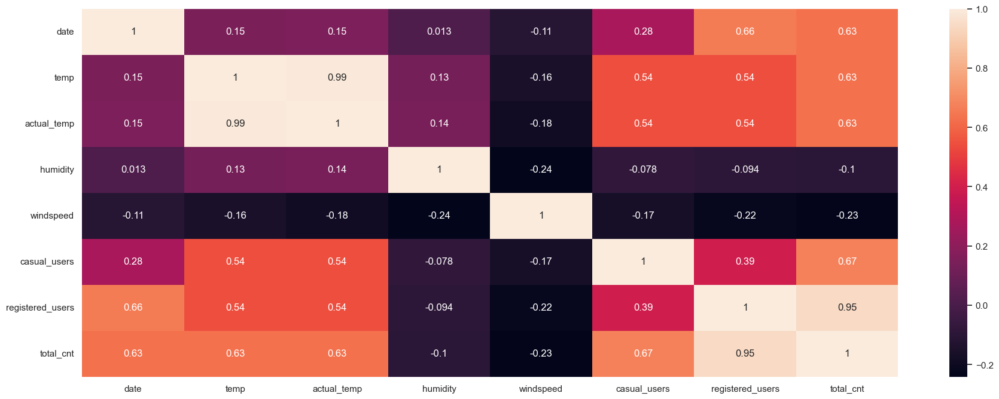

In [16]:
# Display the Correlation values Using the SNS. Heatmap. 
plt.figure(figsize=(22,8))
sns.heatmap(bike_share_df.select_dtypes(exclude=[object,'category']).corr(), annot=True)
plt.show();

Observation:
- total_cnt is positively correlated with casual and registered 
- due to high positive correlation of total_cnt with 'registered' and 'casual', we can assume that there is relation among these as total_cnt is based of registered and casual and hence registered and casual can be removed before model building

- total_cnt is negatively correlated to windspeed. 
gives an impression that the shared bikes demand will be somewhat less on windy days as compared to normal days.
atemp and temp are highly (positively) correlated. there we can remove one among these two before model building


### 3. MLR - Data Preparation (One Hot Encoding)

In [17]:
# Validate the dataframe Content and the column datatypes 
bike_share_df.head(2)
bike_share_df.dtypes

,date,season,year,month,holiday,weekday,workingday,weathersit,temp,actual_temp,humidity,windspeed,casual_users,registered_users,total_cnt
0,2018-01-01,Spring,2018,Jan,NotHoliday,Mon,Workingday,Mist,14.110847,18.181250,80.583300,10.749882,331,654,985
1,2018-01-02,Spring,2018,Jan,NotHoliday,Tue,Workingday,Mist,14.902598,17.686950,69.608700,16.652113,131,670,801


date                datetime64[ns]
season                    category
year                      category
month                     category
holiday                   category
weekday                   category
workingday                category
weathersit                category
temp                       float64
actual_temp                float64
humidity                   float64
windspeed                  float64
casual_users                 int64
registered_users             int64
total_cnt                    int64
dtype: object

#### Dummy Variables Creation

In [18]:
# Convert all the categorical columns to numerical values (in dummy variables format), Using get_dummies  
bike_share_mod_df = bike_share_df.copy()
dummy_df = pd.get_dummies(bike_share_mod_df, columns=['season', 'year', 'month', 'holiday', 'weekday', 'workingday', 'weathersit'], dtype=int, drop_first=True)
bike_share_mod_df = dummy_df.copy()

bike_share_mod_df.head(2)

,date,temp,actual_temp,humidity,windspeed,casual_users,registered_users,total_cnt,season_Spring,season_Summer,season_Winter,year_2019,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,holiday_NotHoliday,weekday_Mon,weekday_Sat,weekday_Sun,weekday_Thur,weekday_Tue,weekday_Wed,workingday_Workingday,weathersit_LightRain,weathersit_Mist
0,2018-01-01,14.110847,18.181250,80.583300,10.749882,331,654,985,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,1
1,2018-01-02,14.902598,17.686950,69.608700,16.652113,131,670,801,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1


In [19]:
bike_share_df_bk = bike_share_mod_df.copy()
#-- bike_share_mod_df = bike_share_df_bk

# Drop all the unwanted features from the dataframe.
bike_share_mod_df = bike_share_mod_df.drop(['date', 'casual_users', 'registered_users','actual_temp'], axis=1)
bike_share_mod_df = bike_share_mod_df.astype(float)
bike_share_mod_df.head(2)

,temp,humidity,windspeed,total_cnt,season_Spring,season_Summer,season_Winter,year_2019,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,holiday_NotHoliday,weekday_Mon,weekday_Sat,weekday_Sun,weekday_Thur,weekday_Tue,weekday_Wed,workingday_Workingday,weathersit_LightRain,weathersit_Mist
0,14.110847,80.583300,10.749882,985.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
1,14.902598,69.608700,16.652113,801.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000


### 4. MLR - Data Splitting for Train,Test Sets and Rescaling

In [20]:
# To perform multiple linear regression, We now convert the given dataset into train and test subsets, at a ratio of 80:20  

df_train, df_test  = train_test_split(bike_share_mod_df, train_size=0.8,test_size=0.2, random_state=0)
df_train.shape, df_test.shape

((584, 29), (146, 29))

#### scaling using MinMaxScaler

In [21]:
# In order to avoid scaling issues during model training, We use the MinMaxscalar to scale all Variables Between zero and one 
scaler = MinMaxScaler()
num_vars = ['temp', 'humidity', 'windspeed','total_cnt']

# A method on transformers which fits the estimator and returns the transformed training data
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.head(2)

,temp,humidity,windspeed,total_cnt,season_Spring,season_Summer,season_Winter,year_2019,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,holiday_NotHoliday,weekday_Mon,weekday_Sat,weekday_Sun,weekday_Thur,weekday_Tue,weekday_Wed,workingday_Workingday,weathersit_LightRain,weathersit_Mist
239,0.807351,0.428211,0.775475,0.496088,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
97,0.344785,0.810325,0.545905,0.166705,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


#### Visualizing the correlations

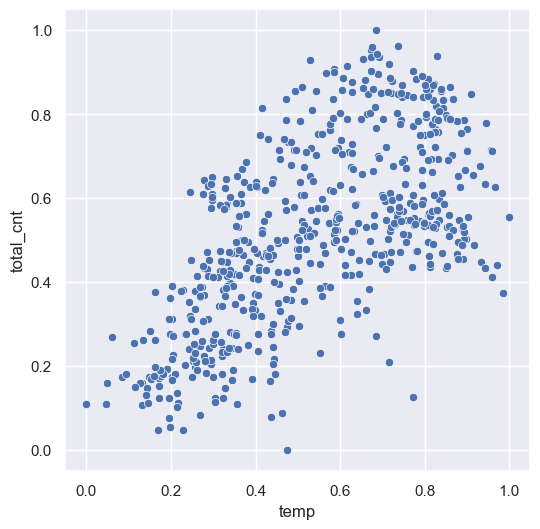

In [22]:
# Linear correlation between temp and total_cnt
plt.figure(figsize=(6,6))
sns.scatterplot(x='temp', y='total_cnt', data=df_train)
plt.show();

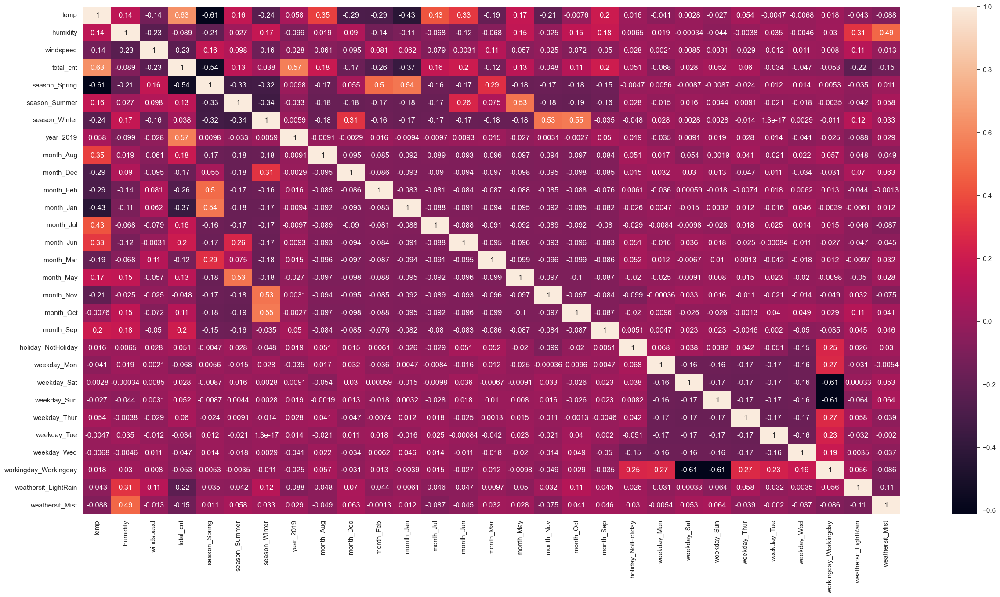

In [23]:
# Heatmap to check the correlation amongst the variables
plt.figure(figsize=(30,15))
sns.heatmap(df_train.corr(), annot=True)
plt.show();

### 5. MLR - Model Building & Analysis using SKlearn on Train data

In [24]:
# To build the model, We now Split the Train data set Into X_train with predictor variables and Y_train with target variable.
Y_train = df_train.pop('total_cnt')
X_train = df_train

X_train.head(2)
Y_train.head(2)
X_train.shape, Y_train.shape

,temp,humidity,windspeed,season_Spring,season_Summer,season_Winter,year_2019,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,holiday_NotHoliday,weekday_Mon,weekday_Sat,weekday_Sun,weekday_Thur,weekday_Tue,weekday_Wed,workingday_Workingday,weathersit_LightRain,weathersit_Mist
239,0.807351,0.428211,0.775475,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
97,0.344785,0.810325,0.545905,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


239   0.496088
97    0.166705
Name: total_cnt, dtype: float64

((584, 28), (584,))

In [25]:
# Perform Ordinary least squares Linear Regression.
lr_model = LinearRegression() # Create object lr_model
lr_model.fit(X_train, Y_train) # Fit linear model using X_train and Y_train

LinearRegression()

In [26]:
# Get Coefficients of all the trained columns of lr_model using coef_ return it as dataframe
coef_df = pd.DataFrame(lr_model.coef_, X_train.columns, columns=["Coefficient"])
coef_df.head()

print('---------------------------------------------------')
print(f'Model_Score: {lr_model.score(X_train, Y_train)}')
print(f'Model_Intercept: {lr_model.intercept_}')

,Coefficient
temp,0.438665
humidity,-0.147242
windspeed,-0.121544
season_Spring,-0.093910
season_Summer,0.006138


---------------------------------------------------
Model_Score: 0.8370930015017464
Model_Intercept: 0.30300351026871525


##### Predicting on Training dataset 


In [27]:
Y_train_pred = lr_model.predict(X_train)
Y_comp_df = pd.DataFrame({"Actual" : Y_train, "Predicted" : Y_train_pred})
Y_comp_df.head()

,Actual,Predicted
239,0.496088,0.499726
97,0.166705,0.286831
503,0.951680,0.855537
642,0.935803,0.861560
498,0.324551,0.633351


In [28]:
def adj_r2_score(xfe, yt, ypred):
    SS_Reg = np.sum((yt - ypred)**2)
    SS_Total = np.sum((yt - np.mean(yt))**2)
    r2 = 1-SS_Reg/SS_Total
    
    n = len(xfe)
    p = len(xfe.columns)
    adj_r2 = 1-((1-r2)*(n-1))/(n-p-1)
    return adj_r2

print('---------------------------------------------------')
print(f'Model_Score: {lr_model.score(X_train, Y_train)}')
print(f'Model_Intercept: {lr_model.intercept_}')
print(f'Mean Absolute Error: {mean_absolute_error(Y_train, Y_train_pred)}')
print(f'Mean Squared Error: {mean_squared_error(Y_train, Y_train_pred)}')
print(f'Root Mean Squared Error: {np.sqrt(mean_squared_error(Y_train, Y_train_pred))}') 
print(f'R2_score: {r2_score(Y_train, Y_train_pred)}')
print(f'Adjusted_R2_score: {adj_r2_score(X_train, Y_train, Y_train_pred)}')

---------------------------------------------------
Model_Score: 0.8370930015017464
Model_Intercept: 0.30300351026871525
Mean Absolute Error: 0.0641989884673339
Mean Squared Error: 0.007699439599146163
Root Mean Squared Error: 0.08774645063560214
R2_score: 0.8370930015017464
Adjusted_R2_score: 0.8288742700459786


##### Model Analysis using SKlearn on Test data

In [29]:
# For testing model, We now Split the Test data set into X_test with predictor variables and Y_test with target variable.
num_vars = ['temp', 'humidity', 'windspeed','total_cnt']
df_test[num_vars] = scaler.transform(df_test[num_vars])

X_test = df_test.copy()
Y_test = X_test.pop('total_cnt')

X_test.head(5)
Y_test.head(5)
X_test.shape, Y_test.shape

,temp,humidity,windspeed,season_Spring,season_Summer,season_Winter,year_2019,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,holiday_NotHoliday,weekday_Mon,weekday_Sat,weekday_Sun,weekday_Thur,weekday_Tue,weekday_Wed,workingday_Workingday,weathersit_LightRain,weathersit_Mist
196,0.781941,0.460557,0.490778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
187,0.860857,0.552784,0.345523,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
14,0.217065,0.340487,0.341867,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
31,0.165779,0.801018,0.032244,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
390,0.352054,0.717517,0.091901,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


196   0.678900
187   0.525771
14    0.141049
31    0.153935
390   0.466291
Name: total_cnt, dtype: float64

((146, 28), (146,))

In [30]:
# Predict the y_pred values using lr_model.predict() 
# Compare the actual values vs predicted values.
 
Y_pred = lr_model.predict(X_test)
Y_comp_df = pd.DataFrame({"Actual" : Y_test, "Predicted" : Y_pred})
Y_comp_df.head()

,Actual,Predicted
196,0.678900,0.463670
187,0.525771,0.538209
14,0.141049,0.126886
31,0.153935,0.116398
390,0.466291,0.418788


In [31]:
# Get Coefficients of all the test columns of lr_model using lr_model.coef_ return it as dataframe
coef_df = pd.DataFrame(lr_model.coef_, X_test.columns, columns=["Coefficient"])
coef_df.head()

,Coefficient
temp,0.438665
humidity,-0.147242
windspeed,-0.121544
season_Spring,-0.093910
season_Summer,0.006138


In [32]:
print('---------------------------------------------------')
print(f'Model_Score: {lr_model.score(X_test, Y_test)}')
print(f'Model_Intercept: {lr_model.intercept_}')
print(f'Mean Absolute Error: {mean_absolute_error(Y_test, Y_pred)}')
print(f'Mean Squared Error: {mean_squared_error(Y_test, Y_pred)}')
print(f'Root Mean Squared Error: {np.sqrt(mean_squared_error(Y_test, Y_pred))}') 
print(f'R2_score: {r2_score(Y_test, Y_pred)}')
print(f'Adjusted_R2_score: {adj_r2_score(X_test, Y_test, Y_pred)}')

---------------------------------------------------
Model_Score: 0.8712402002824886
Model_Intercept: 0.30300351026871525
Mean Absolute Error: 0.06804551577481996
Mean Squared Error: 0.007545283334061818
Root Mean Squared Error: 0.08686359038205718
R2_score: 0.8712402002824886
Adjusted_R2_score: 0.8404258892389816


This model **Adj R2 score** is **84%**. 
We need to see if we can reduce the number of features and exclude those which are not much relevant in explaining the target variable. 

### 6. MLR - Recursive Feature Elimination (RFE)

In [33]:
# Since the coefficient of determination of the prediction, is not in Recommended range, 
# We now perform Recursive feature elimination, to eliminate Unnecessary features from the Training data set   

rfe = RFE(estimator=lr_model, n_features_to_select= 15, step=1) # RFE rank feature and remove one feature at a time till features count = 15
rfe = rfe.fit(X_train, Y_train) # fit the RFE model on the Training data set

In [34]:
#Now combines columns and rank and return as table,
# best features are assigned rank 1.
a = list(zip(X_train.columns,rfe.support_,rfe.ranking_))
sorted(a,key=lambda x:x[2])

[('temp', True, 1),
 ('humidity', True, 1),
 ('windspeed', True, 1),
 ('season_Spring', True, 1),
 ('season_Winter', True, 1),
 ('year_2019', True, 1),
 ('month_Dec', True, 1),
 ('month_Feb', True, 1),
 ('month_Jan', True, 1),
 ('month_Jul', True, 1),
 ('month_Nov', True, 1),
 ('month_Sep', True, 1),
 ('holiday_NotHoliday', True, 1),
 ('weathersit_LightRain', True, 1),
 ('weathersit_Mist', True, 1),
 ('workingday_Workingday', False, 2),
 ('weekday_Sat', False, 3),
 ('weekday_Sun', False, 4),
 ('month_May', False, 5),
 ('weekday_Mon', False, 6),
 ('weekday_Tue', False, 7),
 ('month_Aug', False, 8),
 ('month_Jun', False, 9),
 ('weekday_Wed', False, 10),
 ('month_Mar', False, 11),
 ('month_Oct', False, 12),
 ('season_Summer', False, 13),
 ('weekday_Thur', False, 14)]

In [35]:
# Top 15 features from RFE
rfe_top_features = X_train.columns[rfe.support_]
rfe_top_features

Index(['temp', 'humidity', 'windspeed', 'season_Spring', 'season_Winter',
       'year_2019', 'month_Dec', 'month_Feb', 'month_Jan', 'month_Jul',
       'month_Nov', 'month_Sep', 'holiday_NotHoliday', 'weathersit_LightRain',
       'weathersit_Mist'],
      dtype='object')

In [36]:
# lowest ranked features from RFE
rfe_bottom_ranked = X_train.columns[~rfe.support_]
rfe_bottom_ranked

Index(['season_Summer', 'month_Aug', 'month_Jun', 'month_Mar', 'month_May',
       'month_Oct', 'weekday_Mon', 'weekday_Sat', 'weekday_Sun',
       'weekday_Thur', 'weekday_Tue', 'weekday_Wed', 'workingday_Workingday'],
      dtype='object')

### 7. MLR - Model Building and Analysis on top features(RFE) 

In [37]:
# Perform Ordinary least squares Linear Regression.
X_train_rfe = X_train[rfe_top_features]

lr_model = LinearRegression() 
lr_model.fit(X_train_rfe,Y_train)

# Get Coefficients of all the trained columns of lr_model using coef_ return it as dataframe
coef_df = pd.DataFrame(lr_model.coef_, X_train_rfe.columns, columns=["Coefficient"])
coef_df

print('---------------------------------------------------')
print(f'Model_Score: {lr_model.score(X_train_rfe, Y_train)}')
print(f'Model_Intercept: {lr_model.intercept_}')

LinearRegression()

,Coefficient
temp,0.406779
humidity,-0.142953
windspeed,-0.124305
season_Spring,-0.098555
season_Winter,0.069679
year_2019,0.224385
month_Dec,-0.064447
month_Feb,-0.049548
month_Jan,-0.066233
month_Jul,-0.068706


---------------------------------------------------
Model_Score: 0.8293483572406961
Model_Intercept: 0.31058533723271714


### 8. MLR - Model building and Variance Inflation factor analysis using Statsmodel 

In [38]:
def train_sm(Xtr, Ytr): # This function creates a new lr_model using statsmodel upon called. 
    Xtr_sm = sm.add_constant(Xtr) # Adding a constant variable , a column of ones to an array.
    lr = sm.OLS(Ytr, Xtr_sm) # Create Ordinary Least Squares model 
    lrn_model = lr.fit() # fit the model
    l_param = lrn_model.params # params
    l_summary = lrn_model.summary() # summary
    return l_summary, l_param, lrn_model, Xtr_sm

# Measure of VIF, Multicollinearity among features and returns the VIF score for each feature. 
def find_VIF(Xtr): 
    vif = pd.DataFrame()
    vif['Features'] = Xtr.columns
    vif['VIF'] = [variance_inflation_factor(Xtr.values, i) for i in range(Xtr.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif

##### Base Model

In [39]:
# train_sm function creates a new model whenever invoked 
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param       # summary of the linear model
# find_VIF function return the VIF score for all the features
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.829
 Model:                            OLS   Adj. R-squared:                  0.825
 Method:                 Least Squares   F-statistic:                     184.0
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          1.27e-206
 Time:                        23:43:33   Log-Likelihood:                 578.83
 No. Observations:                 584   AIC:                            -1126.
 Df Residuals:                     568   BIC:                            -1056.
 Df Model:                          15                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
12,holiday_NotHoliday,21.000000
0,temp,17.040000
1,humidity,14.990000
2,windspeed,4.980000
3,season_Spring,4.380000
4,season_Winter,2.900000
14,weathersit_Mist,2.450000
8,month_Jan,2.270000
5,year_2019,2.070000
7,month_Feb,2.030000


##### Model 1

In [40]:
# 'holiday_NotHoliday' has very high VIF. Hence dropped

X_train_rfe = X_train_rfe.drop(["holiday_NotHoliday"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.828
 Model:                            OLS   Adj. R-squared:                  0.824
 Method:                 Least Squares   F-statistic:                     195.5
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          1.04e-206
 Time:                        23:43:33   Log-Likelihood:                 576.29
 No. Observations:                 584   AIC:                            -1123.
 Df Residuals:                     569   BIC:                            -1057.
 Df Model:                          14                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
1,humidity,13.880000
0,temp,11.990000
2,windspeed,4.270000
3,season_Spring,4.080000
4,season_Winter,2.770000
13,weathersit_Mist,2.450000
8,month_Jan,2.220000
5,year_2019,2.060000
7,month_Feb,2.010000
10,month_Nov,1.810000


##### Model 2

In [41]:
# 'humidity' is insignificant in presence of other variables. Hence dropped.

X_train_rfe = X_train_rfe.drop(["humidity"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param,  # summary of the linear model
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.820
 Model:                            OLS   Adj. R-squared:                  0.816
 Method:                 Least Squares   F-statistic:                     199.5
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          3.02e-202
 Time:                        23:43:33   Log-Likelihood:                 562.95
 No. Observations:                 584   AIC:                            -1098.
 Df Residuals:                     570   BIC:                            -1037.
 Df Model:                          13                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
0,temp,4.760000
1,windspeed,4.230000
2,season_Spring,3.880000
3,season_Winter,2.540000
7,month_Jan,2.170000
4,year_2019,2.030000
6,month_Feb,2.000000
9,month_Nov,1.790000
5,month_Dec,1.570000
12,weathersit_Mist,1.520000


##### Model 3

In [42]:
# 'windspeed' is insignificant in presence of other variables. Hence dropped.

X_train_rfe = X_train_rfe.drop(["windspeed"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param,  # summary of the linear model
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.811
 Model:                            OLS   Adj. R-squared:                  0.807
 Method:                 Least Squares   F-statistic:                     204.2
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          1.52e-197
 Time:                        23:43:33   Log-Likelihood:                 549.05
 No. Observations:                 584   AIC:                            -1072.
 Df Residuals:                     571   BIC:                            -1015.
 Df Model:                          12                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
1,season_Spring,3.570000
0,temp,2.800000
2,season_Winter,2.540000
6,month_Jan,2.160000
3,year_2019,2.020000
5,month_Feb,2.000000
8,month_Nov,1.750000
4,month_Dec,1.570000
11,weathersit_Mist,1.500000
7,month_Jul,1.340000


##### Model 4 - Alternate Model

- This model very much satisfies the criteria, hence can be used as final model
- The VIFs and p-values both are within an acceptable range. 
- We will see if we can still reduce the features to avoid overfitting

In [43]:
# 'month_Feb' is insignificant in presence of other variables. Hence dropped.

X_train_rfe = X_train_rfe.drop(["month_Feb"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param,  # summary of the linear model
find_VIF(X_train_rfe)
sm_model_tmp, X_train_sm_tmp = sm_model, X_train_sm

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.810
 Model:                            OLS   Adj. R-squared:                  0.806
 Method:                 Least Squares   F-statistic:                     221.3
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          7.29e-198
 Time:                        23:43:33   Log-Likelihood:                 547.01
 No. Observations:                 584   AIC:                            -1070.
 Df Residuals:                     572   BIC:                            -1018.
 Df Model:                          11                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
0,temp,2.790000
2,season_Winter,2.490000
3,year_2019,2.020000
1,season_Spring,1.910000
7,month_Nov,1.740000
5,month_Jan,1.580000
10,weathersit_Mist,1.500000
4,month_Dec,1.460000
6,month_Jul,1.340000
8,month_Sep,1.170000


##### Model 5

In [44]:
# 'month_Jan' is insignificant in presence of other variables. Hence dropped.

X_train_rfe = X_train_rfe.drop(["month_Jan"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param,  # summary of the linear model
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.808
 Model:                            OLS   Adj. R-squared:                  0.805
 Method:                 Least Squares   F-statistic:                     241.5
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          4.06e-198
 Time:                        23:43:33   Log-Likelihood:                 544.77
 No. Observations:                 584   AIC:                            -1068.
 Df Residuals:                     573   BIC:                            -1019.
 Df Model:                          10                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
0,temp,2.770000
2,season_Winter,2.470000
3,year_2019,2.020000
6,month_Nov,1.730000
9,weathersit_Mist,1.500000
4,month_Dec,1.420000
5,month_Jul,1.340000
1,season_Spring,1.290000
7,month_Sep,1.170000
8,weathersit_LightRain,1.060000


##### Model 6

In [45]:
# 'month_Nov' is insignificant in presence of other variables. Hence dropped.

X_train_rfe = X_train_rfe.drop(["month_Nov"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param,  # summary of the linear model
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.804
 Model:                            OLS   Adj. R-squared:                  0.801
 Method:                 Least Squares   F-statistic:                     261.5
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          1.35e-196
 Time:                        23:43:33   Log-Likelihood:                 538.31
 No. Observations:                 584   AIC:                            -1057.
 Df Residuals:                     574   BIC:                            -1013.
 Df Model:                           9                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
0,temp,2.760000
3,year_2019,2.020000
2,season_Winter,1.540000
8,weathersit_Mist,1.490000
5,month_Jul,1.340000
1,season_Spring,1.290000
4,month_Dec,1.270000
6,month_Sep,1.170000
7,weathersit_LightRain,1.060000


##### Model 7 Final Model

In [46]:
# 'month_Dec' is insignificant in presence of other variables. Hence dropped.

X_train_rfe = X_train_rfe.drop(["month_Dec"], axis = 1)
summary, param, sm_model, X_train_sm = train_sm(X_train_rfe, Y_train)
summary, param,  # summary of the linear model
find_VIF(X_train_rfe)

(<class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:              total_cnt   R-squared:                       0.803
 Model:                            OLS   Adj. R-squared:                  0.801
 Method:                 Least Squares   F-statistic:                     293.7
 Date:                Tue, 27 Aug 2024   Prob (F-statistic):          1.67e-197
 Time:                        23:43:33   Log-Likelihood:                 537.51
 No. Observations:                 584   AIC:                            -1057.
 Df Residuals:                     575   BIC:                            -1018.
 Df Model:                           8                                         
 Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
 -----------------------------------------------------------

,Features,VIF
0,temp,2.750000
3,year_2019,2.020000
7,weathersit_Mist,1.480000
2,season_Winter,1.340000
4,month_Jul,1.340000
1,season_Spring,1.250000
5,month_Sep,1.160000
6,weathersit_LightRain,1.060000


the VIFs and p-values both are within an acceptable range. So we go ahead and make our predictions using this model only.

### 9. MLR - Residual Analysis of the training data


In [47]:
y_train_pred = sm_model.predict(X_train_sm)

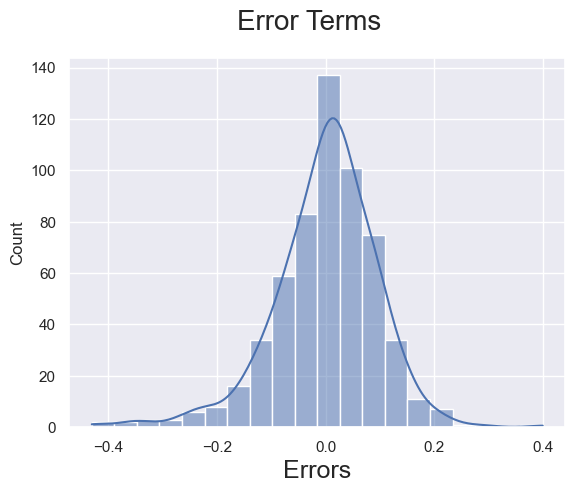

In [48]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.histplot((Y_train - y_train_pred), bins = 20,kde=True)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 
plt.show();

the error terms are also normally distributed

### 10. MLR - Predictions on the Test Data Using the Final Model

In [49]:
# Dividing into X_test and Y_test
Y_test = df_test.pop('total_cnt')
X_test = df_test

In [50]:
# using our trained model to make predictions.
# Creating X_test_new dataframe by dropping variables from X_test

final_features = X_train_rfe.columns
X_test_new = X_test[final_features]

X_test_new = sm.add_constant(X_test_new) # Adding a constant variable 
Y_test_pred = sm_model.predict(X_test_new) # Making predictions

Y_comp_df = pd.DataFrame({"Actual" : Y_test, "Predicted" : Y_test_pred})
Y_comp_df.head()

,Actual,Predicted
196,0.678900,0.493691
187,0.525771,0.529732
14,0.141049,0.110694
31,0.153935,0.087272
390,0.466291,0.401564


In [51]:
# To find top 3 features of the model
coefficients = sm_model.params
# Get the feature names
feature_names = final_features

# Create a dataframe to store the top_features
top_features = pd.DataFrame({'feature': feature_names, 'coefficient': coefficients[1:]})
# Sort the dataframe by coefficient absolute value
top_features = top_features.sort_values(by='coefficient', key=abs, ascending=False)

print(top_features.reset_index(drop=True).head(5))

                feature  coefficient
0                  temp     0.456706
1  weathersit_LightRain    -0.284113
2             year_2019     0.229219
3         season_Spring    -0.119780
4       weathersit_Mist    -0.073536


In [52]:
print('---------------------------------------------------')
print(f'Mean Absolute Error: {mean_absolute_error(Y_test, Y_test_pred)}')
print(f'Mean Absolute Percentage Error: {mean_absolute_percentage_error(Y_test, Y_test_pred)}')
print(f'Mean Squared Error: {mean_squared_error(Y_test, Y_test_pred)}')
print(f'Root Mean Squared Error: {np.sqrt(mean_squared_error(Y_test, Y_test_pred))}') 
print(f'R2_score: {r2_score(Y_test, Y_test_pred)}')
print(f'Adjusted_R2_score: {adj_r2_score(X_test, Y_test, Y_test_pred)}')
print(f'Adjusted_R2_score using sm_model_rsq_adj: {sm_model.rsquared_adj}')

---------------------------------------------------
Mean Absolute Error: 0.07332379465688707
Mean Absolute Percentage Error: 0.21722130847518956
Mean Squared Error: 0.008736601751308767
Root Mean Squared Error: 0.09346979058128228
R2_score: 0.8509104241809033
Adjusted_R2_score: 0.8152308675746238
Adjusted_R2_score using sm_model_rsq_adj: 0.8006724734729809


The **R2** and **Adj R2** scores are **85%** and **81%** respectively, hence we can conclude that the model seems to performs well on **Untrained dataset**  

In [ ]:
y_test = Y_test
y_pred = Y_test_pred

In [53]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.8509104241809033

### 11. MLR - Model Evaluation

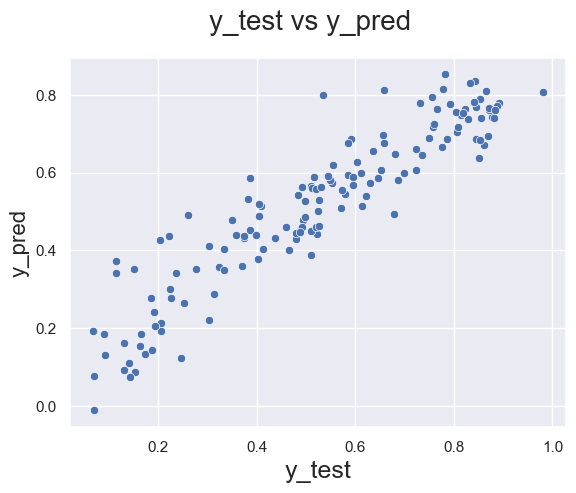

In [54]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.scatterplot(x=Y_test,y=Y_test_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)
plt.xlabel('y_test', fontsize=18)                 
plt.ylabel('y_pred', fontsize=16)  
plt.show();

We can see that the equation of our best fitted line is:

$ total cnt = 0.204875C  - 0.456706 \times temp - 0.119780 \times season Spring + 0.046074  \times  season Winter + 0.229219 \times year 2019 - 0.068302 \times month Jul + 0.050646 \times  month Sep - 0.284113 \times  weathersit LightRain - 0.073536 \times weathersitMist $

The Bike Sharing demand prediction: 
Inference:
- People usually prefer bikes during Cloudy, non-rainy/non-snowy days 
- There is a positive growth in 2019, therefore even though pandemic has made things worse there is higher chance of getting positive growth once things get back to normalcy.
- people prefer to ride bikes when the temperature is moderate.
- Most people prefer to use bikes in the fall.

- Therefore it is advised to Bike sharing company to prepare/plan/forecast ahead of these situations.
to cater the needs/demand of the users, which ultimately result in more users on the platform and a positive growth.
- Thus enabling much needed return on investment.



Note:
- When you perform dummy encoding (also known as one-hot encoding) in machine learning, the first category is often implicit, meaning it's not explicitly represented as a column. This is done to avoid multicollinearity, which can lead to unstable estimates of the regression coefficients.

- Notice that the `cloudy` category is not explicitly represented as a column. This is because the first category (`cloudy`) is implicit, and the coefficients for the other categories (`LightRain` and `Mist`) are estimated relative to this implicit category.

- Now, let's say we want to infer the final model. We can write the model equation as:

    y = β0 + β1 \* LightRain + β2 \* Mist + ε

    where y is the response variable, β0 is the intercept, β1 and β2 are the coefficients for the `LightRain` and `Mist` categories, respectively, and ε is the error term.

- To infer the effect of the `cloudy` category, we need to consider the implicit category. We can do this by setting the `LightRain` and `Mist` variables to 0, which effectively selects the `cloudy` category.

- The predicted value for the `cloudy` category is then:

    y = β0 + 0 \* β1 + 0 \* β2 = β0

- So, the intercept (β0) represents the expected value of the response variable when the `weathersit` variable is `cloudy`.

- To illustrate this with an example, let's say we have the following estimated coefficients:
    - β0 = 10 , β1 = -2, β2 = -3

The predicted values for each category would be:

* `cloudy`: y = 10 (since β0 represents the expected value for `Cloudy`)
* `Lightrain`: y = 10 - 2 = 8
* `Mist`: y = 10 - 3 = 7

In this example, the implicit `cloudy` category has an expected value of 10, while the `Lightrain` and `Mist` categories have expected values of 8 and 7, respectively, relative to the `cloudy` category.